In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
! git clone -v https://gitlab.com/yunus.bayu.aji/nlp.git

fatal: destination path 'nlp' already exists and is not an empty directory.


In [3]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import GlobalAveragePooling1D
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Conv1D
from tensorflow.keras.optimizers import  Adam
from keras.callbacks import ModelCheckpoint
from sklearn.model_selection import train_test_split
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from google.colab import data_table
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import re
import string
import nltk
import sys

In [4]:
class Config:
  def __init__(self):
    print("Load Config")
    # Download Resource
    nltk.download('punkt')
    nltk.download('stopwords')
    nltk.download('wordnet')
    
    # Init Directory
    self.dir = "/content/nlp/imdb_master.csv"
    self.model_dir = "/content/drive/MyDrive/Dicoding/"
    
    # Training Param
    self.num_epochs = 1000
    self.output_dim = 128
    self.verbose = 1
    self.num_words = 30000
    self.batch_size = 800
    self.loss = 'categorical_crossentropy'
    self.optimizer = Adam(learning_rate = 2e-5)
    self.metrics = 'accuracy'

    # Text Processing
    self.stop_words = nltk.corpus.stopwords.words("english")
    self.stemmer = PorterStemmer()
    self.lemmatizer = WordNetLemmatizer()

class CB(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy')>0.95):
      self.model.stop_training = True
    if epoch%5 == 0:
      self.model.save(filepath="/content/drive/MyDrive/Dicoding/"+"model.h5")

class DicodingNLP(Config, ):
  def __init__(self):
    super().__init__()
    self.callbacks = CB()
    print("Starting NLP Program ...")

  def load_data(self):
    data_table.DataTable(self.n_data, include_index=False, num_rows_per_page=10)
    self.n_data.to_csv(self.model_dir+'dataset.csv', mode='w', index=False, header=True)
    self.gen_label = [x for x in self.n_data.columns if not x == "review"]
    self.final_dim = len(self.gen_label)
    self.description = self.n_data.review.values
    self.label = self.n_data[self.gen_label]

    print("Description Data Dimension\t: ", self.description.shape)
    print("label Data Dimension\t\t: ", self.label.shape)
    print()
    return self.n_data
  
  def split(self):
    self.x_train, self.x_test, self.y_train, self.y_test = train_test_split(self.description,
                                                                            self.label,
                                                                            test_size = 0.2,
                                                                            random_state=9999)
    
    print("X Train Dimension \t\t: ", self.x_train.shape)
    print("Y Train Dimension \t\t: ", self.y_train.shape)
    print("X Test Dimension \t\t: ", self.x_test.shape)
    print("Y Test Dimension \t\t: ", self.y_test.shape)
    print()
  
  def tokenizer(self):
    self.token = Tokenizer(num_words=self.num_words, oov_token="x")
    self.token.fit_on_texts(self.x_train)
    self.token.fit_on_texts(self.x_test)

    self.train_sekuens = self.token.texts_to_sequences(self.x_train)
    self.test_sekuens = self.token.texts_to_sequences(self.x_test)

    self.train_padded = pad_sequences(self.train_sekuens)
    self.test_padded = pad_sequences(self.test_sekuens)
      
  def build_model(self):
    if os.path.exists(self.model_dir+"model.h5"):
      print("Load Model From ", self.model_dir+"model.h5")
      self.model = tf.keras.models.load_model(self.model_dir+"model.h5")
    else:
      print("First Time Training")
      self.model = tf.keras.Sequential([Embedding(input_dim = self.num_words, output_dim = self.output_dim),
                                        LSTM(128),
                                        Dropout(0.5),
                                        Dense(5),
                                        Dense(self.final_dim, activation = 'sigmoid'),
                                        ])
                                    
      self.model.compile(loss = self.loss,
                          optimizer = self.optimizer,
                          metrics = [self.metrics])
  
  def plot(self, hist):
    plt.plot(hist['Loss'])
    plt.plot(hist['Val Loss'])
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Loss'], loc='upper right')
    plt.show()

    plt.plot(hist['Acc'])
    plt.plot(hist['Val Acc'])
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['Train'], loc='lower right')
    plt.show()
  
  def train(self):
    self.checkpoint = ModelCheckpoint(filepath=self.model_dir+"model.h5", 
                             monitor="val_accuracy",
                             verbose=1, 
                             save_best_only=True,
                             mode="max")
    self.history = self.model.fit(self.train_padded, 
                                  self.y_train,
                                  epochs = self.num_epochs,
                                  batch_size = self.batch_size,
                                  validation_data = (self.test_padded, self.y_test),
                                  verbose = self.verbose,
                                  callbacks = [self.callbacks, self.checkpoint])
    self.model.save(filepath=self.model_dir+"model.h5")
  
  def preprocessing(self):
    self.data = pd.read_csv(self.dir, encoding='ISO-8859-1')
    
    self.review = self.data.review.str.lower() # Make setences lower
    self.review = self.review.str.rstrip(string.digits) # Remove number
  
    for x in range(len(self.review)):
      # Remove digits
      self.review[x] = ''.join([i for i in self.review[x] if not i.isdigit()])
      sys.stdout.write('\r'+'Remove Digit Progress ' + str(100*(x+1)/len(self.review)) + "%")
    else:
      print()

    self.review = self.review.str.translate(str.maketrans("","", string.punctuation)) # Remove punctuation
    self.review = self.review.str.strip() # Remove whitespace
    self.review = self.review.apply(lambda x: " ".join([word for word in x.split() if word not in (self.stop_words)]))

    for x in range(len(self.review)):
      # Stemming
      self.input_string = word_tokenize(self.review[x])
      self.review[x] = " ".join([self.stemmer.stem(word) for word in self.input_string])
      sys.stdout.write('\r'+'Stemming Progress ' + str(100*(x+1)/len(self.review)) + "%")
    else:
      print()

    for x in range(len(self.review)):
      # Lemmatization
      self.input_string = word_tokenize(self.review[x])
      self.review[x] = " ".join([self.lemmatizer.lemmatize(word) for word in self.input_string])
      sys.stdout.write('\r'+'Lemmatization Progress ' + str(100*(x+1)/len(self.review)) + "%")
    else:
      print()

    self.n_data = pd.concat([self.review.astype(str), 
                             pd.get_dummies(self.data.label)], axis = 1)
    
    self.n_data = self.n_data.drop(self.n_data.loc[self.n_data["unsup"] == 1].index)
    self.n_data = self.n_data.drop(columns=["unsup"])

    return self.n_data

  def start(self):
    if os.path.exists(self.model_dir+"dataset.csv"):
      print("Dataset Exist")
      self.n_data = pd.read_csv(self.model_dir+"dataset.csv")
    else:
      print("Dataset Not Exist, Doing Text Preprocessing")
      self.preprocessing()
    self.load_data()
    self.split()
    self.tokenizer()
    self.build_model()
    self.train()

NLP = DicodingNLP()
# NLP.preprocessing()
NLP.start()

Load Config
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
Starting NLP Program ...
Dataset Exist
Description Data Dimension	:  (50000,)
label Data Dimension		:  (50000, 2)

X Train Dimension 		:  (40000,)
Y Train Dimension 		:  (40000, 2)
X Test Dimension 		:  (10000,)
Y Test Dimension 		:  (10000, 2)

First Time Training
Epoch 1/1000
50/50 [==============================] - 33s 590ms/step - loss: 0.6928 - accuracy: 0.5171 - val_loss: 0.6927 - val_accuracy: 0.5420

Epoch 00001: val_accuracy improved from -inf to 0.54200, saving model to /content/drive/MyDrive/Dicoding/model.h5
Epoch 2/1000
50/50 [==============================] - 29s 576ms/step - loss: 0.6924 - accuracy: 0.5375 - val_loss: 0.

In [5]:
history = pd.DataFrame({"Acc" : NLP.history.history['accuracy'],
                        "Loss" : NLP.history.history['loss'],
                        "Val Acc" : NLP.history.history['val_accuracy'],
                        "Val Loss" : NLP.history.history['val_loss'],
                        })
if os.path.exists(NLP.model_dir+"history.csv"):
  print("Append Existing History")
  history.to_csv(NLP.model_dir+'history.csv', mode='a', index=False, header=False)
else:
  print("Write New History")
  history.to_csv(NLP.model_dir+'history.csv', mode='w', index=False, header=True)

Write New History


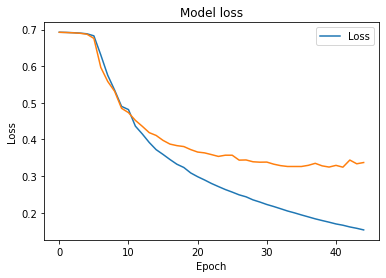

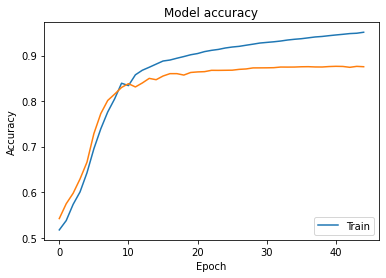

In [6]:
plt_history = pd.read_csv(NLP.model_dir+'history.csv')
NLP.plot(plt_history)

In [7]:
data_table.DataTable(NLP.n_data, include_index=False, num_rows_per_page=10)

,review,neg,pos
0,mr costner drag movi far longer necessari asid...,1,0
1,exampl major action film gener bore there real...,1,0
2,first hate moron rapper couldnt act gun press ...,1,0
3,even beatl could write song everyon like altho...,1,0
4,brass pictur movi fit word realli somewhat bra...,1,0
...,...,...,...
49995,see vote averag pretti low fact clerk video st...,0,1
49996,plot wretch unbeliev twist howev chemistri mel...,0,1
49997,amaz movieand other averag star lower crappi m...,0,1
49998,christma togeth actual came time ive rais john...,0,1
